In [22]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
import utm
import hdbscan
import os
import contextily as ctx
import numpy as np
import folium
import webbrowser

In [11]:
hilo_full = pd.read_parquet('hilo_full_patterns.parquet')

In [12]:
# Restructure the dataset so each row represents a place visit

# Make a subset of the dataset
columns_to_keep = ['placekey', 'location_name', 'latitude', 'longitude', 'raw_visit_counts', 'raw_visitor_counts', 'related_same_day_brand', 'date_range_start']
df_subset = hilo_full[columns_to_keep].copy()

# Fill NaNs in the raw_visit_counts column with zero and make all entries in that column integers 
df_subset['raw_visit_counts'] = pd.to_numeric(df_subset['raw_visit_counts'], errors='coerce').fillna(0).astype(int)

# Use repeat to expand the DataFrame
expanded_df = df_subset.loc[df_subset.index.repeat(df_subset['raw_visit_counts'])].reset_index(drop=True)

In [43]:
def split_into_months(df, city):
    # Extract month from the date
    df['month'] = df['date_range_start'].str[5:7].astype("Int64")

    # Create a directory for saving the output
    output_dir = 'data/foot-traffic/output'
    os.makedirs(output_dir, exist_ok=True)

    # Create and save a dataframe for each month
    for month in range(1, 13):
        month_df = df[df['month'] == month]
        output_file_name = f"{city}_month_{month}.csv"
        output_file_path = os.path.join(output_dir, output_file_name)
        month_df.to_csv(output_file_path, index=False)
        print(f"Saved month {month} data to {output_file_path}")

In [45]:
def perform_hdbscan(data, min_cluster_size, min_samples, output_file_name=None):
    """
    Perform HDBSCAN clustering on provided geographic data and optionally save the results.

    Parameters:
    - data (pd.DataFrame): DataFrame containing the longitude and latitude columns.
    - min_cluster_size (int): The minimum size of clusters; not less than this number of points will form a cluster.
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point. This helps control the degree of noise.
    - output_file_name (str): Optional; The name of the file to save the clusters, saved to 'data/foot-traffic/output' if specified.
    
    Returns:
    - gpd.GeoDataFrame: GeoDataFrame with cluster labels.
    """
    # Clean dataset
    data = data.dropna(subset=['longitude', 'latitude'])

    # Convert DataFrame to GeoDataFrame with longitude and latitude
    gdf = gpd.GeoDataFrame(
        data,
        geometry=gpd.points_from_xy(data.longitude, data.latitude),
        crs='EPSG:4326'
    )

    # Convert to UTM coordinates for accurate distance measurement
    median_zone_number = int(gdf['geometry'].apply(lambda x: utm.latlon_to_zone_number(x.y, x.x)).median())
    utm_crs = f'+proj=utm +zone={median_zone_number} +ellps=WGS84 +datum=WGS84 +units=m +no_defs'
    gdf = gdf.to_crs(utm_crs)

    # Perform HDBSCAN clustering
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
    labels = clusterer.fit_predict(pd.DataFrame({'x': gdf.geometry.x, 'y': gdf.geometry.y}))
    gdf['cluster'] = labels

    # Save output if a file name is specified
    if output_file_name:
        # Define the directory for saving the file
        save_directory = "data/foot-traffic/output"
        os.makedirs(save_directory, exist_ok=True)

        # Full path for saving the file
        save_path = os.path.join(save_directory, output_file_name)

        # Save to GeoJSON
        gdf.to_file(save_path, driver='GeoJSON')
        print(f"Clusters saved to {save_path}")

    return gdf, utm_crs

In [46]:
def summarize_clusters(gdf):
    """
    Summarizes the clusters in a GeoDataFrame that includes a 'cluster' label column.

    Parameters:
    - gdf (gpd.GeoDataFrame): GeoDataFrame with a 'cluster' column where -1 indicates noise.
    
    Returns:
    - pd.DataFrame: DataFrame where each row represents a cluster with columns for the
                    number of points in the cluster, the cluster label, and the centroid geometry.
    """
    # Filter out the noise points
    clusters = gdf[gdf['cluster'] != -1]

    if clusters.empty:
        return pd.DataFrame(columns=['cluster_label', 'num_points', 'geometry'])

    # Group by cluster label
    grouped = clusters.groupby('cluster')

    # Create a summary DataFrame
    summary_df = pd.DataFrame({
        'num_points': grouped.size(),  # Count points per cluster
        'centroid': grouped['geometry'].apply(lambda x: x.unary_union.centroid)  # Calculate centroid
    }).reset_index()

    # Rename columns appropriately
    summary_df.columns = ['cluster_label', 'num_points', 'geometry']

    return summary_df

In [47]:
def plot_cluster_centroids(cluster_summary_df, utm_crs, output_file_name=None):
    """
    Plots the centroids of clusters on a map, annotating each centroid with the number of points in the cluster,
    and overlays this on a basemap for geographical context, with an optional save function.
    
    Parameters:
        cluster_summary_df (DataFrame): DataFrame with columns 'cluster_label', 'num_points', and 'geometry' (centroids).
        utm_crs (str): The CRS used in the cluster summary data.
        output_file_name (str): Optional; The name of the output file, saved to 'data/foot-traffic/plots'.
    """
    # Convert to a GeoDataFrame if necessary
    if not isinstance(cluster_summary_df, gpd.GeoDataFrame):
        gdf = gpd.GeoDataFrame(cluster_summary_df, geometry='geometry', crs=utm_crs)
    else:
        gdf = cluster_summary_df

    # Convert CRS to WGS84 for Folium
    gdf = gdf.to_crs(epsg=4326)

    # Create the base map centered on the first cluster centroid
    if not gdf.empty:
        first_lat = gdf.iloc[0]['geometry'].y
        first_lon = gdf.iloc[0]['geometry'].x
        map_obj = folium.Map(location=[first_lat, first_lon], zoom_start=12)

        # Add centroids and annotations
        for idx, row in gdf.iterrows():
            # Circle Marker
            folium.CircleMarker(
                location=[row['geometry'].y, row['geometry'].x],
                radius=row['num_points'] / 700,
                color='blue',
                fill=True,
                fill_color='blue',
                fill_opacity=0.6,
                popup=f"Cluster {row['cluster_label']}: {row['num_points']} points"
            ).add_to(map_obj)

        # Add a legend to the map with better alignment and a visual circle marker example
        legend_html = '''
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 180px; height: 100px; 
                    border: 2px solid grey; z-index:9999; font-size:14px;
                    text-align: center; padding-top: 10px;">
                      <b>Legend</b><br>
                      Cluster Centroids <span style="color:blue;">&#11044;</span><br>
                      Circle markers are<br>
                      proportional in size<br>
        </div>
        '''
        map_obj.get_root().html.add_child(folium.Element(legend_html))

        # Save or display the map
        if output_file_name:
            output_dir = 'data/foot-traffic/plots'
            os.makedirs(output_dir, exist_ok=True)
            
            output_file_name = output_file_name if output_file_name.endswith('.html') else output_file_name + '.html'
            output_file_path = os.path.join(output_dir, output_file_name)
            map_obj.save(output_file_path)
            print(f"Map saved to {output_file_path}")

            # Open in a web browser
            webbrowser.open(f"file://{os.path.abspath(output_file_path)}")
        else:
            # Display directly in a web browser
            temp_file_path = 'temp_map.html'
            map_obj.save(temp_file_path)
            webbrowser.open(f"file://{os.path.abspath(temp_file_path)}")

        return map_obj
    else:
        print("No clusters to display.")
        return None

# Hilo Foot Traffic HDBSCAN Maps by Month from 2018-2021

In [44]:
# HDBSCAN cluster centroids plot for January

# Perform clustering for January
data = pd.read_csv("output_month_01.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)

# Restructure dataset and get centroids
cluster_summary = summarize_clusters(clustered_gdf)

# Plot cluster centroids
plot_cluster_centroids(cluster_summary, utm_crs)

In [48]:
# HDBSCAN cluster centroids plot for February
data = pd.read_csv("output_month_02.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [49]:
# HDBSCAN cluster centroids plot for March
data = pd.read_csv("output_month_03.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [50]:
# HDBSCAN cluster centroids plot for April
data = pd.read_csv("output_month_04.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [51]:
# HDBSCAN cluster centroids plot for May
data = pd.read_csv("output_month_05.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [52]:
# HDBSCAN cluster centroids plot for June
data = pd.read_csv("output_month_06.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [53]:
# HDBSCAN cluster centroids plot for July
data = pd.read_csv("output_month_07.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [54]:
# HDBSCAN cluster centroids plot for August
data = pd.read_csv("output_month_08.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [55]:
# HDBSCAN cluster centroids plot for September
data = pd.read_csv("output_month_09.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [56]:
# HDBSCAN cluster centroids plot for October
data = pd.read_csv("output_month_10.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [57]:
# HDBSCAN cluster centroids plot for November
data = pd.read_csv("output_month_11.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

In [58]:
# HDBSCAN cluster centroids plot for December
data = pd.read_csv("output_month_12.csv")
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=50, min_samples=20)
cluster_summary = summarize_clusters(clustered_gdf)
plot_cluster_centroids(cluster_summary, utm_crs)

# Appendix

In [21]:
# Original plotting function

def plot_cluster_centroids(cluster_summary_df, utm_crs):
    """
    Plots the centroids of clusters on a map, annotating each centroid with the number of points in the cluster,
    and overlays this on a basemap for geographical context.
    
    Parameters:
    - cluster_summary_df (pd.DataFrame): DataFrame with columns 'cluster_label', 'num_points', and 'geometry' (centroids).
    """
    
    # Assuming the centroid geometries are in latitude and longitude
    gdf = gpd.GeoDataFrame(cluster_summary_df, geometry='geometry', crs=utm_crs)

    # Check and handle NaNs or infinite values
    if gdf.isna().any().any():
        gdf.dropna(inplace=True)  # Drop NaNs

    # Convert CRS to EPSG:3857 for contextily
    gdf = gdf.to_crs(epsg=3857)

    # Create a plot
    fig, ax = plt.subplots(figsize=(10, 8))

    # Adjust marker size based on the number of points, ensuring visibility
    marker_sizes = gdf['num_points'] / gdf['num_points'].max() * 100  # Scale marker size

    # Plot each centroid
    gdf.plot(ax=ax, color='blue', markersize=marker_sizes, alpha=0.6)

    # Annotate the centroid with the number of points in the cluster
    for idx, row in gdf.iterrows():
        ax.text(row.geometry.x, row.geometry.y, f'{row["num_points"]}', fontsize=8, ha='left')

    # Add a basemap with adjusted zoom if needed
    try:
        ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)
    except ValueError:
        # Handle potential ValueError if zoom level is too high
        ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron, zoom=12)  # A more reasonable, fixed zoom level

    # Set plot parameters
    ax.set_title('Cluster Centroids with Number of Points')
    ax.axis('off') 

    plt.show()

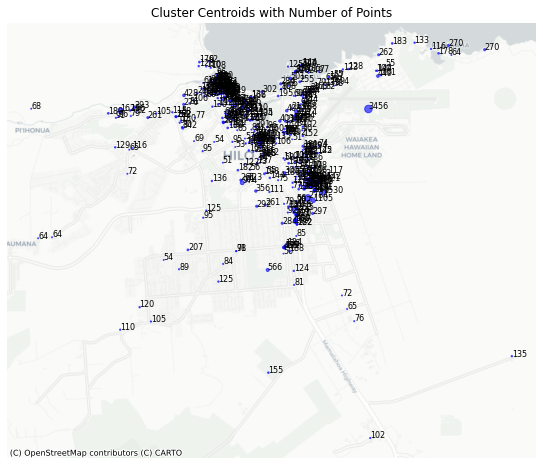

In [ ]:
# Plot the cluster centroids 
# Non folium approach
# For May from 2018-2021
plot_cluster_centroids(cluster_summary, utm_crs)

     cluster_label  num_points                        geometry
0                0           6  POINT (281721.851 2167897.199)
1                1          40  POINT (258495.032 2163207.040)
2                2          11  POINT (258695.667 2163512.322)
3                3         151  POINT (289326.361 2174797.911)
4                4           8  POINT (273367.335 2177289.049)
..             ...         ...                             ...
773            773          29  POINT (281176.876 2182457.377)
774            774         125  POINT (281405.771 2182303.489)
775            775          21  POINT (281403.855 2182292.698)
776            776          18  POINT (281394.073 2182290.160)
777            777          24  POINT (281395.634 2182280.674)

[778 rows x 3 columns]


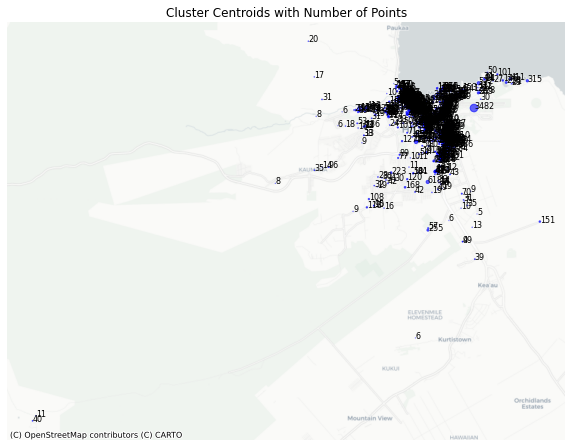

In [65]:
# Perform clustering for June
data = pd.read_csv("output_month_06.csv")
    
clustered_gdf, utm_crs = perform_hdbscan(data, min_cluster_size=5, min_samples=5, filename= 'hilo_cluster_month_06.geojson', save_output=False)

# Restructure dataset and get centroids
cluster_summary = summarize_clusters(clustered_gdf)
print(cluster_summary)

plot_cluster_centroids(cluster_summary, utm_crs)

In [9]:
def dbscan_clustering(data, eps=0.01, min_samples=10, plot=False):
    """
    Perform DBSCAN clustering on provided geographic data.
    
    Parameters:
    - data (pd.DataFrame): DataFrame containing the longitude and latitude columns.
    - eps (float): The maximum distance between two samples for one to be considered as in the neighborhood of the other.
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point.
    - plot (bool): If True, plot the clustering result on a map.
    
    Returns:
    - pd.Series: Cluster labels for each point in the DataFrame.
    """
    # Perform DBSCAN clustering
    clusterer = DBSCAN(eps=eps, min_samples=min_samples, algorithm='auto')
    labels = clusterer.fit_predict(data[['longitude', 'latitude']])
    labels_series = pd.Series(labels, index=data.index)
    
    # Plotting
    if plot:
        f, ax = plt.subplots(1, figsize=(16, 12), dpi=100)
        
        # Subset points that are not part of any cluster (noise)
        noise = data.loc[labels_series == -1, ['longitude', 'latitude']]
        clusters = data.loc[labels_series != -1, ['longitude', 'latitude']]
        
        # Plot clusters
        scatter = ax.scatter(clusters['longitude'], clusters['latitude'], c=labels_series[labels_series != -1], s=5, cmap='viridis', linewidth=0)
        # Plot noise in grey
        ax.scatter(noise['longitude'], noise['latitude'], color='grey', s=5, linewidth=0)
        
        # Add colorbar
        plt.colorbar(scatter, ax=ax, label='Cluster Label')
        
        # Add basemap
        contextily.add_basemap(ax, source=contextily.providers.CartoDB.Positron, crs='EPSG:4326')
        ax.set_axis_off()
        plt.show()

    return labels_series

In [ ]:
def batch_cluster_and_plot(data, eps_range, num_batches):
    """
    Execute clustering and plotting for various eps and min_samples values.
    """
    batch_size = max(int(len(data) * 0.01), 1)
    min_samples_range = range(batch_size, batch_size * (num_batches + 1), batch_size)

    for eps in eps_range:
        for min_samples in min_samples_range:
            gdf = perform_hdbscan(data, eps, min_samples)
            plot_path = f'hilo_dbscan_eps{eps}_min{min_samples}.png'
            plot_clusters(gdf, eps, min_samples, plot_path)